# Import and load data

- 필요한 library와 data를 불러옵니다.

In [33]:
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')
building_info_df = pd.read_csv('building_info.csv')

# seed
seed = 2025

# Translate colums and merge dataframe

- 간단한 번역과 DF 병합 진행했습니다.

In [34]:
ko2en_dict = {
 '건물번호': 'b_num',
 '일시': 'date',
 '기온(°C)': 'tmp',
 '강수량(mm)': 'rain',
 '풍속(m/s)': 'wind',
 '습도(%)': 'hum',
 '일조(hr)': 'sunshine',
 '일사(MJ/m2)': 'solar',
 '전력소비량(kWh)': 'power_consumption',
 '건물유형': 'b_type',
 '연면적(m2)': 'total_area',
 '냉방면적(m2)': 'cooling_area',
 '태양광용량(kW)': 'solar_capacity',
 'ESS저장용량(kWh)': 'ess_capacity',
 'PCS용량(kW)': 'pcs_capacity',
}

def rename_dataframe_columns(df, mapping_dict):
    return df.rename(columns=mapping_dict).copy()

train_df = rename_dataframe_columns(train_df, ko2en_dict)
test_df = rename_dataframe_columns(test_df, ko2en_dict)
building_info_df = rename_dataframe_columns(building_info_df, ko2en_dict)

train_df = pd.merge(train_df, building_info_df, on='b_num', how='left')
test_df = pd.merge(test_df, building_info_df, on='b_num', how='left')

In [35]:
display(train_df.head())
display(test_df.head())

,num_date_time,b_num,date,tmp,rain,wind,hum,sunshine,solar,power_consumption,b_type,total_area,cooling_area,solar_capacity,ess_capacity,pcs_capacity
0,1_20240601 00,1,20240601 00,18.3,0.0,2.6,82.0,0.0,0.0,5794.80,호텔,82912.71,77586.0,-,-,-
1,1_20240601 01,1,20240601 01,18.3,0.0,2.7,82.0,0.0,0.0,5591.85,호텔,82912.71,77586.0,-,-,-
2,1_20240601 02,1,20240601 02,18.1,0.0,2.6,80.0,0.0,0.0,5338.17,호텔,82912.71,77586.0,-,-,-
3,1_20240601 03,1,20240601 03,18.0,0.0,2.6,81.0,0.0,0.0,4554.42,호텔,82912.71,77586.0,-,-,-
4,1_20240601 04,1,20240601 04,17.8,0.0,1.3,81.0,0.0,0.0,3602.25,호텔,82912.71,77586.0,-,-,-


,num_date_time,b_num,date,tmp,rain,wind,hum,b_type,total_area,cooling_area,solar_capacity,ess_capacity,pcs_capacity
0,1_20240825 00,1,20240825 00,26.5,0.0,0.7,80.0,호텔,82912.71,77586.0,-,-,-
1,1_20240825 01,1,20240825 01,26.1,0.0,0.0,80.0,호텔,82912.71,77586.0,-,-,-
2,1_20240825 02,1,20240825 02,25.9,0.0,0.3,83.0,호텔,82912.71,77586.0,-,-,-
3,1_20240825 03,1,20240825 03,25.7,0.0,1.1,83.0,호텔,82912.71,77586.0,-,-,-
4,1_20240825 04,1,20240825 04,25.5,0.0,1.0,86.0,호텔,82912.71,77586.0,-,-,-


# Define the plot function

- 시각화를 위한 함수를 만들었습니다.
- 주중/주말 데이터 변화에 대해 다들 관심이 많으실 것 같습니다.
- 주중은 검정, 주말은 붉은색입니다.
- 매주마다 vertical line을 추가했습니다.
- 초록색 line으로 월요일, 일요일을 표시했습니다.

In [65]:
def plot_column_at_time_add_line_with_week(df, column_name, b_num):
    df['date'] = pd.to_datetime(df['date'], format='%Y%m%d %H')
    df['weekday'] = df['date'].dt.dayofweek
    df['is_weekend'] = df['weekday'] >= 5

    start_index = 0
    plt.figure(figsize=(30,10))

    # Iterate through the dataframe to plot segments
    # Include the current point to connect segments
    for i in range(1, len(df)):
        if df['is_weekend'].iloc[i] != df['is_weekend'].iloc[i-1]:
            segment = df.iloc[start_index:i+1]
            color = 'red' if segment['is_weekend'].iloc[0] else 'black'
            plt.plot(segment['date'], segment[column_name], color=color)
            start_index = i


    # last segment
    segment = df.iloc[start_index:]
    color = 'red' if segment['is_weekend'].iloc[0] else 'black'
    plt.plot(segment['date'], segment[column_name], color=color)

    # vertical lines
    for date in df['date'].dt.normalize().unique():
        if date.weekday() == 0 or date.weekday() == 6: # Monday or Sunday
            plt.axvline(date, color='green', linestyle='--', linewidth=0.8)
        else:
            plt.axvline(date, color='black', linestyle='--', linewidth=0.8)

    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
    plt.xticks(rotation=45)
    plt.title(f'{column_name} over time for Building {b_num}')
    plt.xlabel('Date')
    plt.ylabel(column_name)
    plt.show()

def plot_batch_of_buildings_with_week(df, column_name, b_num_list):
    for num in b_num_list:
        temp = df[df['b_num'] == num].copy()
        plot_column_at_time_add_line_with_week(temp, column_name, num)

# Visualize

In [66]:
# DACON 파일 크기 제한으로 인해 range를 줄입니다.
# 전체 시각화는 max_idx를 101로 키워주세요.
# 원하는 idx를 list로 넘겨도 작동합니다.
min_idx = 1
max_idx = 101

## Power consumption (전력 사용량)

### line plot

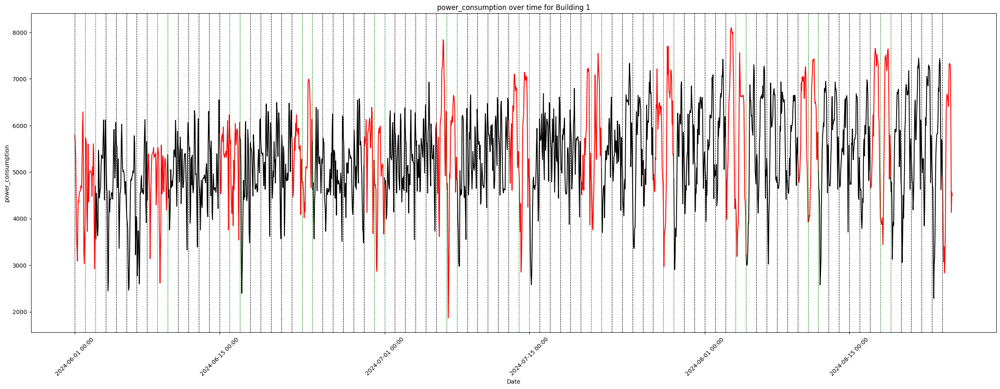

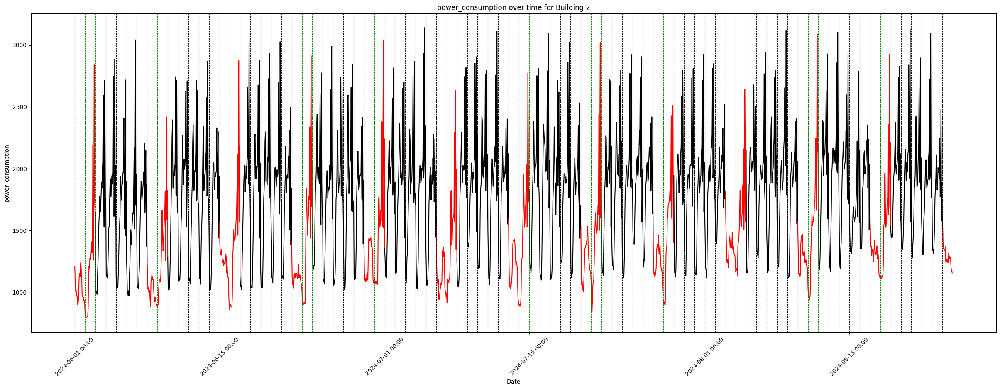

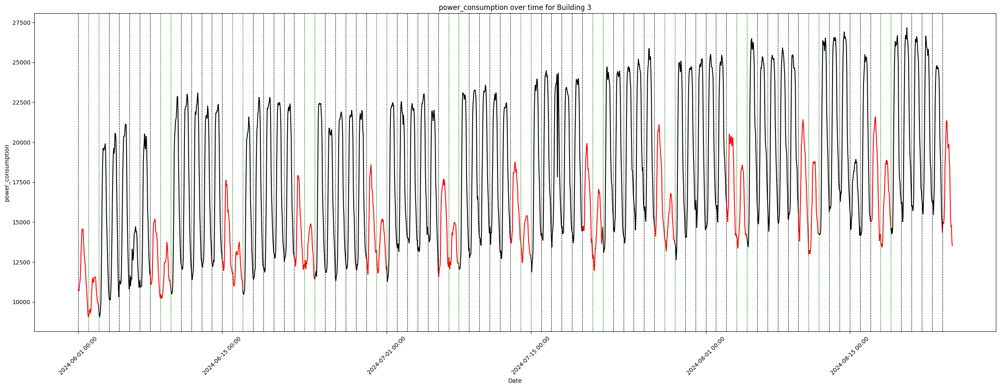

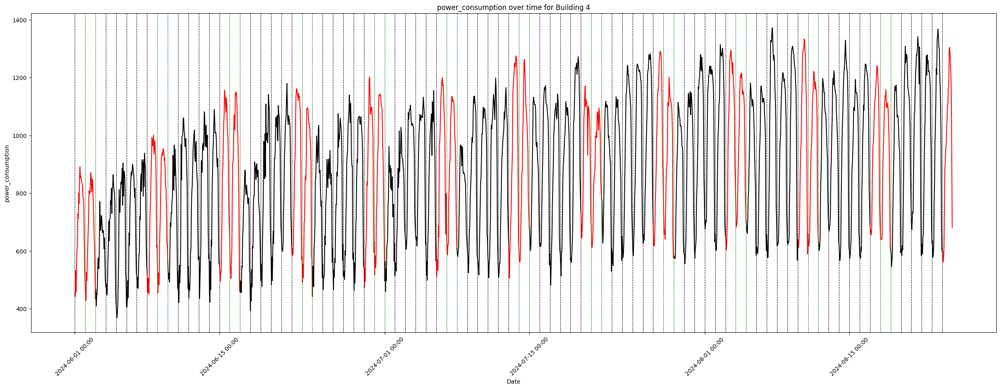

In [67]:
plot_batch_of_buildings_with_week(train_df, 'power_consumption', list(range(min_idx, max_idx)))

### skew plot

- Power consumption에 대한 mean(평균), std(표준편차), skew(왜도)를 그려봤는데요.
- 이전 대회 공유코드를 참고했습니다.
- 저는 당시 데이터셋보다 skew가 적은 것 같아, 아직 log 변환을 적용하지 않고 있습니다. 추후 시도해볼 예정입니다.  
- skew가 높은 값들을 직접 그려보면 일별 최소/최대 전력 사용량의 변동이 큰 편임을 확인 가능합니다.

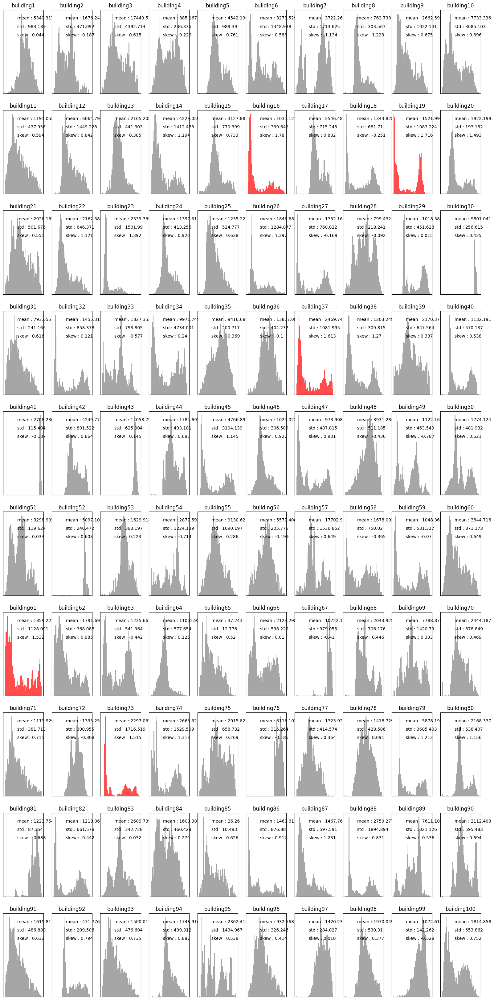

In [68]:
fig = plt.figure(figsize = (20, 50))
for num in range(1,101):
    ax = plt.subplot(12, 10, num)
    energy = train_df.loc[train_df['b_num'] == num, 'power_consumption'].values
    mean = energy.mean().round(3)
    std = energy.std().round(3)
    skew = (3*(mean - np.median(energy))/energy.std()).round(3)
    if skew >= 1.5:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'red')
    elif skew <= -1.5:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'blue')
    else:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'gray')
    plt.title(f'building{num}')
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    plt.text(0.35, 0.9, f'mean : {mean}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.35, 0.8, f'std : {std}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.35, 0.7, f'skew : {skew}',  ha='left', va='center', transform=ax.transAxes)

## Solar(일사량), Sunshine(일조량), Rain(강수량)

앞선 대회에서도 다음 3개의 feature는 drop 하는 경우가 많았습니다.
이번 대회에서도 데이터셋 내 결측치가 많은 column이라 drop을 고민하다가 직접 살펴봤는데요.

그래프를 그려보고 나서, 분포가 정확히 겹치는 건물들이 많다는 점에 주목해서 공유했습니다.

### line plot

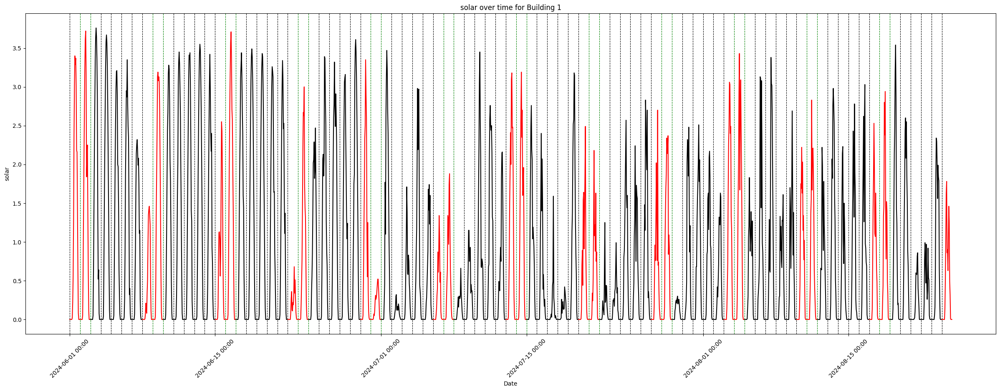

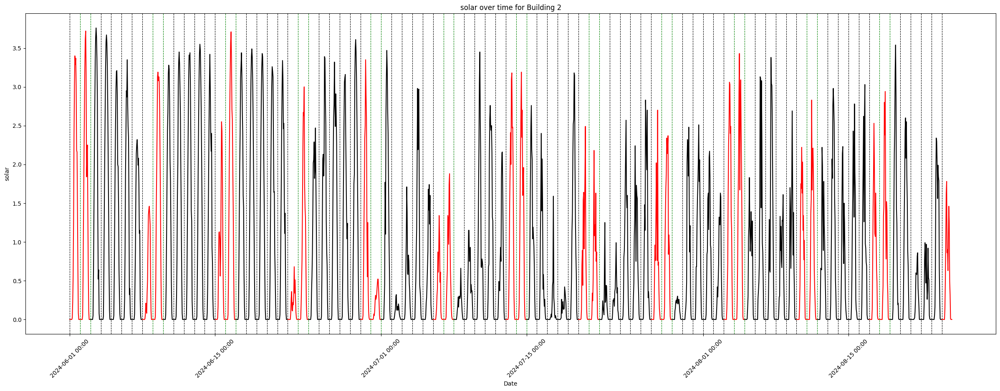

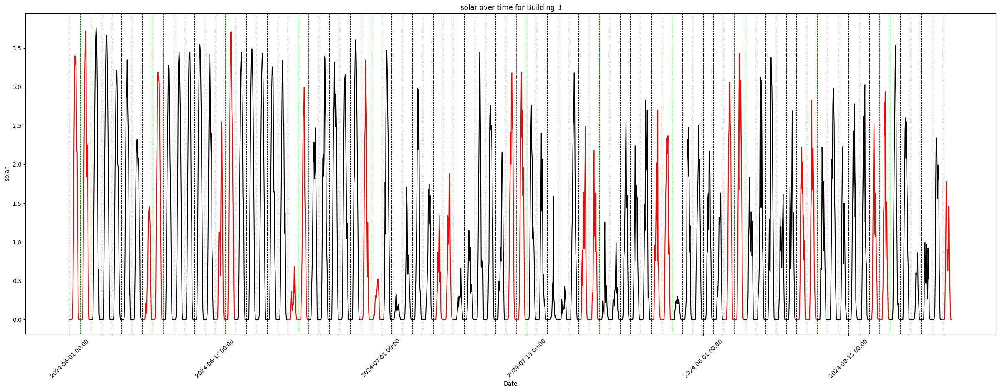

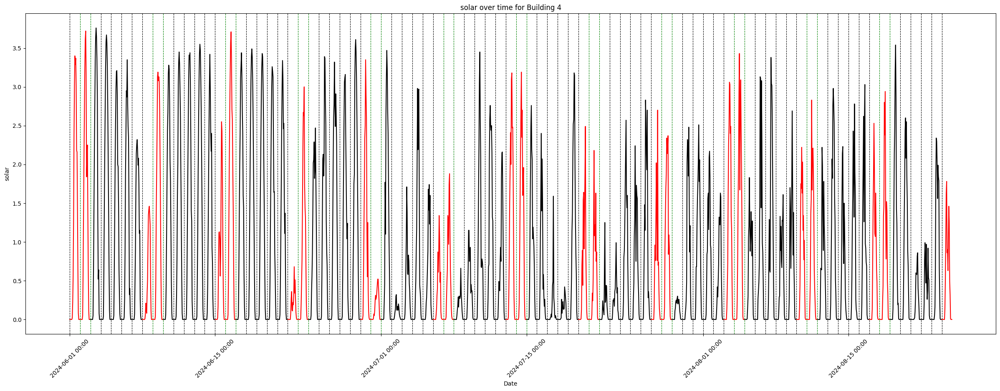

In [69]:
plot_batch_of_buildings_with_week(train_df, 'solar', list(range(min_idx, max_idx)))

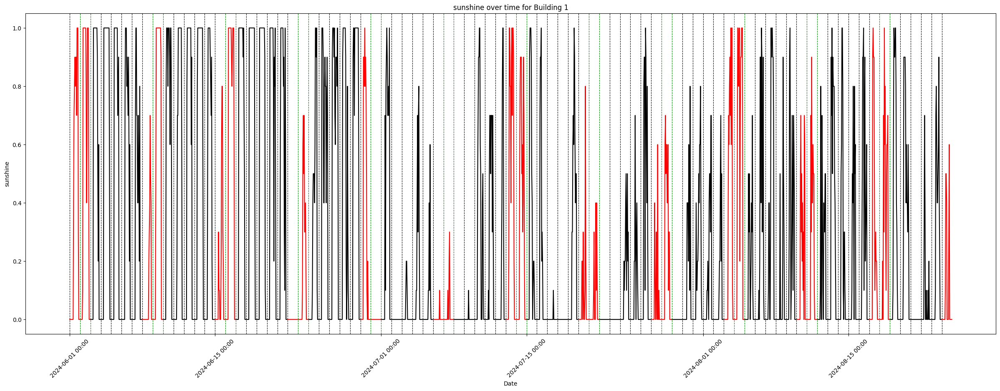

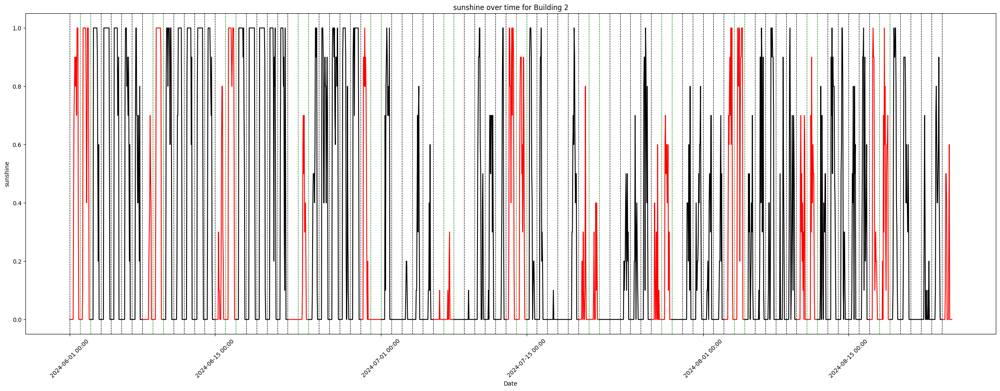

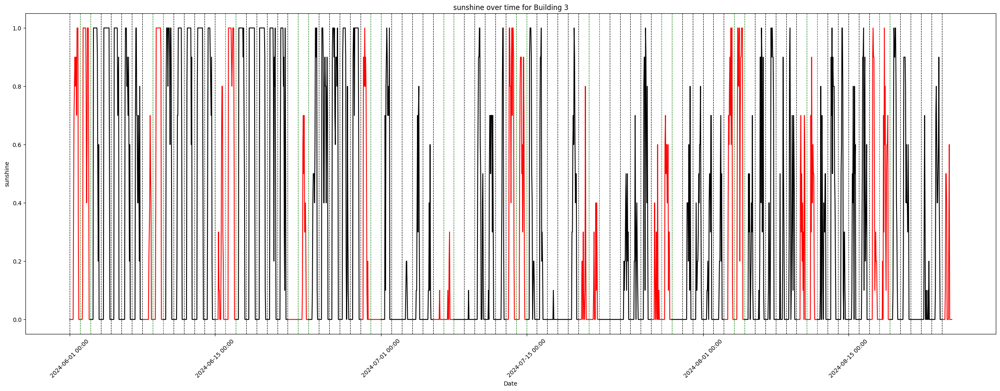

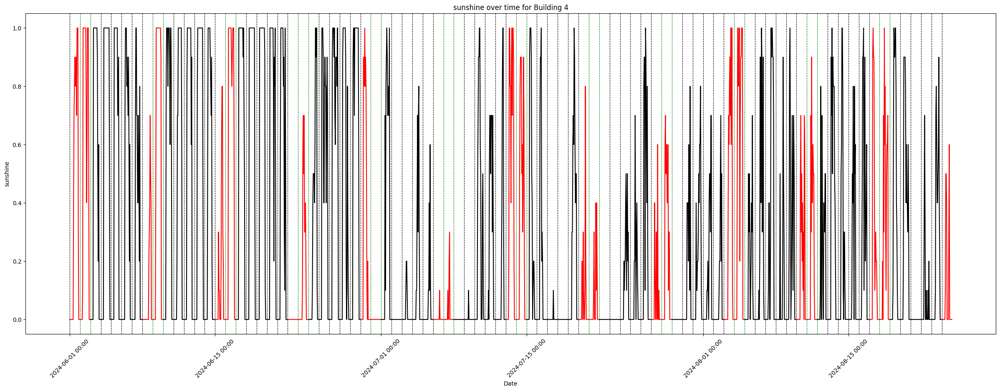

In [70]:
plot_batch_of_buildings_with_week(train_df, 'sunshine', list(range(min_idx, max_idx)))

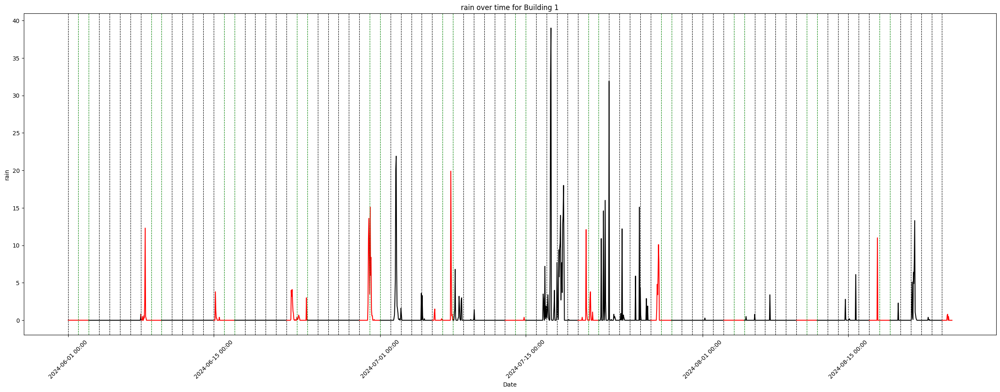

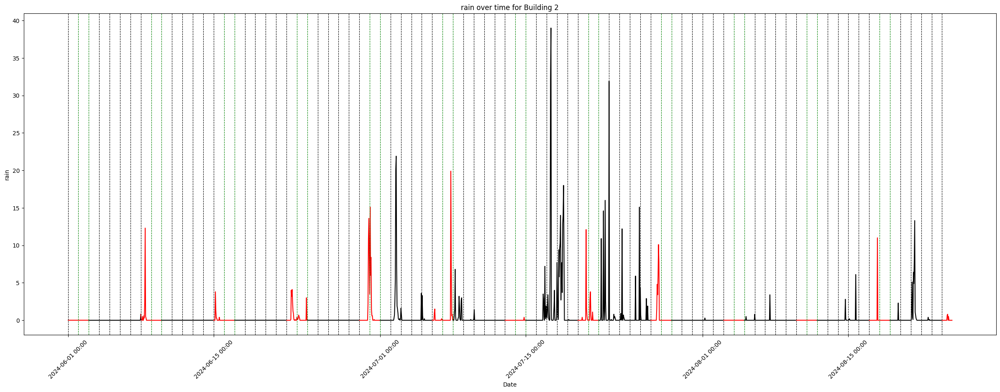

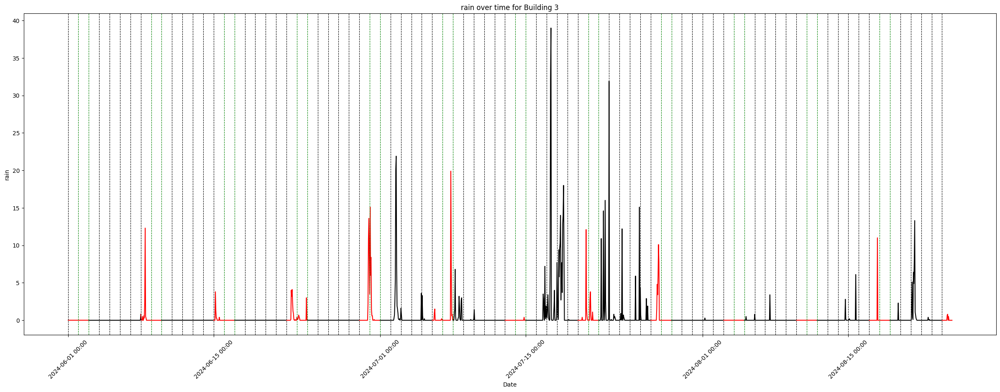

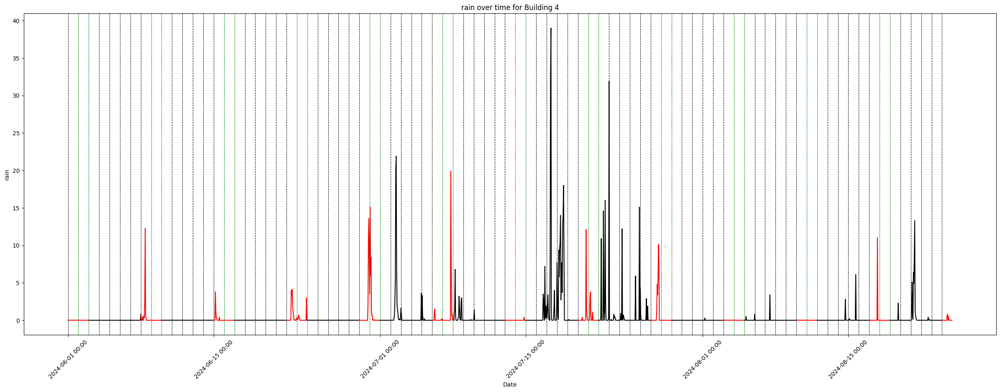

In [71]:
plot_batch_of_buildings_with_week(train_df, 'rain', list(range(min_idx, max_idx)))

# Energy

- 각 건물의 시간별 에너지 분포를 그려보았습니다.
- 주로 어느 시간에 해당 건물의 전력 소비량이 높은지 확인하는데 도움됩니다.

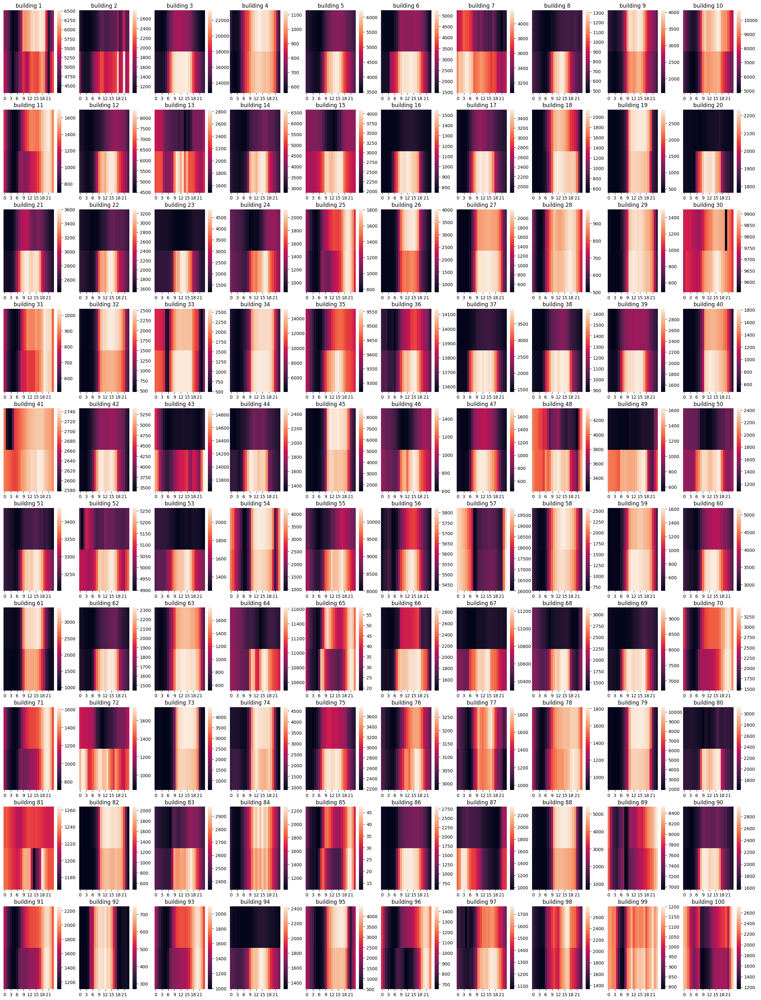

In [86]:
# energy usage of each building ~ weekday, hour
fig = plt.figure(figsize = (30, 60))
for num in train_df['b_num'].unique():
    df = train_df[train_df.b_num == num]
    df = df.groupby(['weekday', 'hour'])['power_consumption'].mean().reset_index().pivot_table(index='weekday', columns='hour', values='power_consumption')
    plt.subplot(15, 10, num)
    sns.heatmap(df)
    plt.title(f'building {num}')
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks([])

# Clustering

- date 관련 파생변수를 처리했습니다.
- 2021년도 공유된 코드를 현 대회 데이터셋에 맞춰 수정했습니다.
- 당시 문법에서 현재 사용가능하도록 python 문법 일부를 수정했습니다.(pivot -> pivot_table 등)
- 최적 cluster 개수로 예상되는 4, 5, 6개 군집개수에 대한 case를 확인했습니다.


## Preprocessing

In [107]:
# 처리에 앞서 date에 대한 처리 진행, month, week, day, time으로 분리
# 이후 dayofweek, weekday, weekend 파생변수 생성
train_df['date'] = pd.to_datetime(train_df['date'], format='%Y%m%d %H')
train_df['month'] = train_df['date'].dt.month
train_df['week'] = train_df['date'].dt.isocalendar().week
train_df['day'] = train_df['date'].dt.day
train_df['hour'] = train_df['date'].dt.hour

train_df['dayofweek'] = train_df['date'].dt.dayofweek
train_df['weekday'] = train_df['dayofweek'].apply(lambda x: 1 if x < 5 else 0)
train_df['weekend'] = train_df['dayofweek'].apply(lambda x: 1 if x >= 5 else 0)

In [110]:
# 건물을 기준으로 하는 data frame 생성, 이후 reindex
# 참고글을 따라 weekday와 hour를 기준으로 분석.
by_weekday = train_df.groupby(['b_num','dayofweek'])['power_consumption'].median().reset_index().pivot_table(index='b_num', columns='dayofweek', values='power_consumption').reset_index()
by_weekday = by_weekday.set_index('b_num').reindex(columns=range(7), fill_value=0).reset_index()
by_weekday.columns = ['b_num'] + [f'day{i}' for i in range(7)]

by_hour = train_df.groupby(['b_num','hour'])['power_consumption'].median().reset_index().pivot_table(index='b_num', columns='hour', values='power_consumption').reset_index().drop('b_num', axis = 1)
by_hour.columns = [f'hour{i}' for i in range(24)]

# Concatenate
# 참고글과 다르게 weekday, hour 처리할 때 column 이름을 설정.
del df # 이전 Energy 확인 과정을 거쳤을 경우에 대한 변수 초기화.
df = pd.concat([by_weekday, by_hour], axis= 1)

# columns => ['b_num'] + [f'day{i}' for i in range(7)] + [f'hour{i}' for i in range(24)]

In [93]:
display(df)

,b_num,day0,day1,day2,day3,day4,day5,day6,hour0,hour1,...,hour14,hour15,hour16,hour17,hour18,hour19,hour20,hour21,hour22,hour23
0,1,4982.625,5371.245,5352.105,5287.68,5454.42,5543.475,5275.635,5240.76,5039.94,...,6072.39,5736.15,5731.02,6026.07,6256.44,6119.16,5315.76,4531.86,5394.87,5577.60
1,2,1884.900,1911.810,1864.050,1857.03,1853.76,1219.290,1512.690,1549.44,1200.18,...,1924.74,1928.82,1985.58,2054.34,2587.20,1786.14,1853.46,2793.36,1622.76,1896.36
2,3,18276.690,18708.960,18500.100,17623.29,18586.23,15185.010,13707.990,13862.94,13551.48,...,22316.94,22270.38,21832.38,20430.12,17607.78,16686.36,15668.64,14784.12,14215.98,13981.14
3,4,810.540,865.140,927.480,956.64,951.78,953.220,908.640,606.84,579.96,...,1111.20,1091.16,1083.00,1098.24,1083.60,1052.76,1018.20,946.20,731.16,622.80
4,5,4627.200,4620.000,4668.480,4489.68,4536.00,4037.520,3906.960,3884.64,3776.16,...,5953.92,5937.12,5712.96,5283.84,4843.68,4668.48,4545.12,4374.72,4183.20,4012.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,821.520,853.560,875.400,896.16,849.84,972.720,957.360,1063.20,906.48,...,835.44,846.72,927.36,1027.44,1140.24,1313.52,1424.16,1436.88,1382.40,1265.28
96,97,1389.960,1441.320,1465.680,1500.24,1446.60,1311.360,1402.320,1232.64,1227.12,...,1693.92,1705.92,1740.24,1740.48,1721.28,1668.72,1565.28,1498.80,1401.60,1337.52
97,98,1890.720,1788.300,1799.820,1939.68,1989.90,2001.960,1974.240,1562.76,1505.52,...,2597.04,2703.24,2826.00,2718.72,2307.24,2196.72,2164.32,2009.52,1818.72,1699.92
98,99,1100.160,1088.820,1112.040,1121.04,1118.70,1089.540,1052.100,1150.56,1145.16,...,1155.60,1154.16,1160.28,1177.56,1090.80,1137.96,1177.92,1222.92,1147.32,1188.72


## scaling(standard scaling)

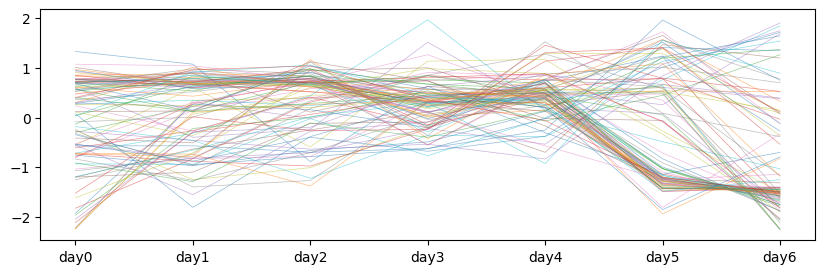

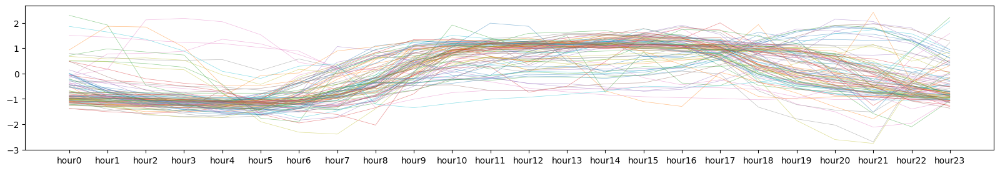

In [94]:
# standard scaling
for i in range(len(df)):
    # 요일 별 전력 중앙값에 대해 scaling
    df.iloc[i,1:8] = (df.iloc[i,1:8] - df.iloc[i,1:8].mean())/df.iloc[i,1:8].std()
    # 시간대별 전력 중앙값에 대해 scaling
    df.iloc[i,8:] = (df.iloc[i,8:] - df.iloc[i,8:].mean())/df.iloc[i,8:].std()

# visualization
fig = plt.figure(figsize = (10,3))
for i in range(len(df)):
    plt.plot(df.iloc[i, 1:8], alpha = 0.5, linewidth = 0.5)
fig = plt.figure(figsize = (20,3))
for i in range(len(df)):
    plt.plot(df.iloc[i, 8:], alpha = 0.5, linewidth = 0.5)

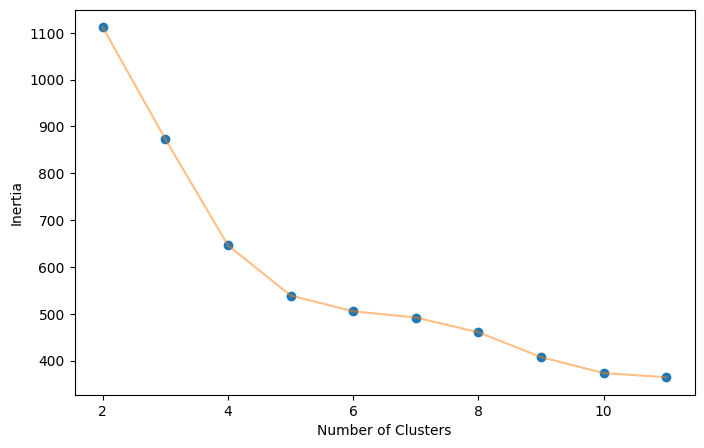

In [95]:
# elbow method를 통해 최적 cluster 개수
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

def change_n_clusters(n_clusters, data):
    sum_of_squared_distance = []
    for n_cluster in n_clusters:
        kmeans = KMeans(n_clusters=n_cluster)
        kmeans.fit(data)
        sum_of_squared_distance.append(kmeans.inertia_)

    plt.figure(1 , figsize = (8, 5))
    plt.plot(n_clusters , sum_of_squared_distance , 'o')
    plt.plot(n_clusters , sum_of_squared_distance , '-' , alpha = 0.5)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')

change_n_clusters([2,3,4,5,6,7,8,9,10,11], df.iloc[:,1:])

## K=4
- cluster (day of week / hour)
- energy
- line

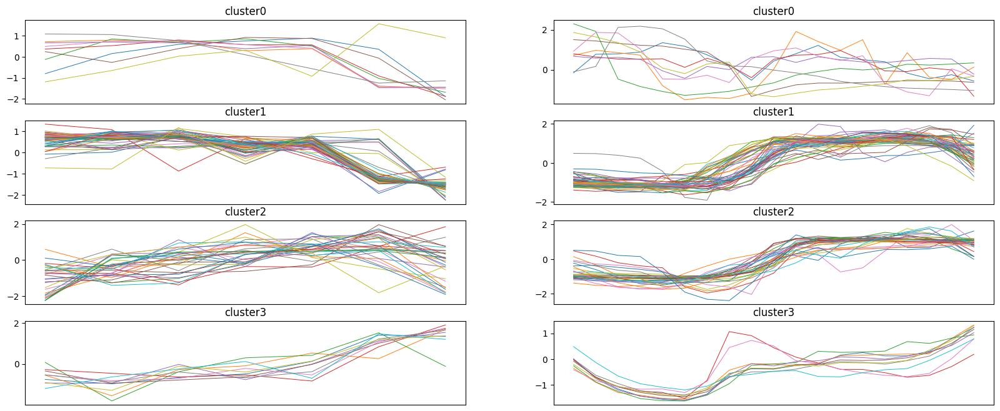

In [96]:
seed = 2025 # seed마다 clustering 결과가 다소 차이 있음.
# pubilc data 비율이 낮으므로 여기에 seed를 맞출 필요는 없음.

kmeans = KMeans(n_clusters=4, random_state = seed)
km_cluster = kmeans.fit_predict(df.iloc[:,1:])
df_clust = df.copy()
df_clust['km_cluster'] = km_cluster
df_clust['km_cluster'] = df_clust['km_cluster'].map({0:1, 1:3, 2:2, 3:0})

# visualizing result of kmeans clustering
n_c = len(np.unique(df_clust.km_cluster))

fig = plt.figure(figsize = (20,8))
for c in range(n_c):
    temp = df_clust[df_clust.km_cluster == c]
    plt.subplot(n_c,2,2*c+1)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,1:8], linewidth=0.7, )
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])
    plt.subplot(n_c,2,2*c+2)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,8:-6], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])

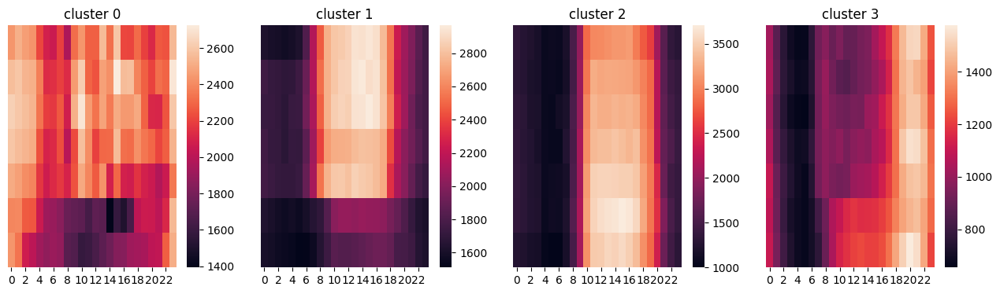

In [97]:
eda_df = train_df.merge(df_clust[['b_num','km_cluster']], on = 'b_num', how = 'left')

fig = plt.figure(figsize = (20, 4))
for c in range(4):
    temp = eda_df[eda_df.km_cluster == c]
    temp = temp.groupby(['dayofweek', 'hour'])['power_consumption'].median().reset_index().pivot_table(index='dayofweek', columns='hour', values='power_consumption')
    plt.subplot(1, 5, c+1)
    sns.heatmap(temp)
    plt.title(f'cluster {c}')
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks([])


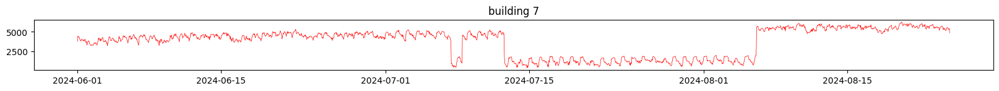

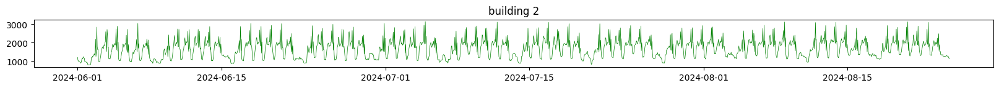

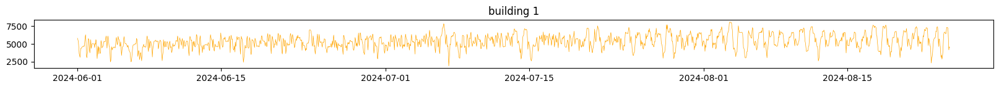

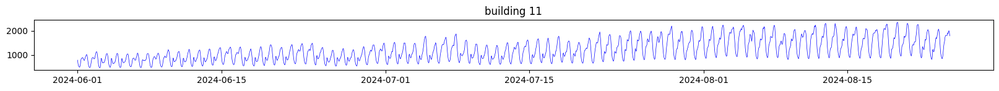

In [100]:
# dictionary mapping cluster and building
match = df_clust[['b_num','km_cluster']]
clust_to_num = {0:[],1:[],2:[],3:[],}
for i in range(100):
    c = match.iloc[i,1]
    clust_to_num[c].append(i+1)

# linplot
for c, col in enumerate(['red','green','orange','blue']):
    temp_1 = eda_df[eda_df.km_cluster == c]
    nums = np.unique(temp_1.b_num)
    n_nums = len(nums)
    fig = plt.figure(figsize = (20, 2*n_nums))
    for i, num in enumerate(nums):
        temp_2 = temp_1[temp_1.b_num == num]
        plt.subplot(n_nums,1, i+1)
        sns.lineplot(data = temp_2, x= 'date', y = 'power_consumption', linewidth = 0.5, color = col)
        plt.title(f'building {num}')
        plt.subplots_adjust(hspace = 1)
        plt.ylabel('')
        plt.xlabel('')

        if i == 0:  # DACON upload를 위해 제한
            break

## K=5

- cluster (day of week / hour)
- energy
- line

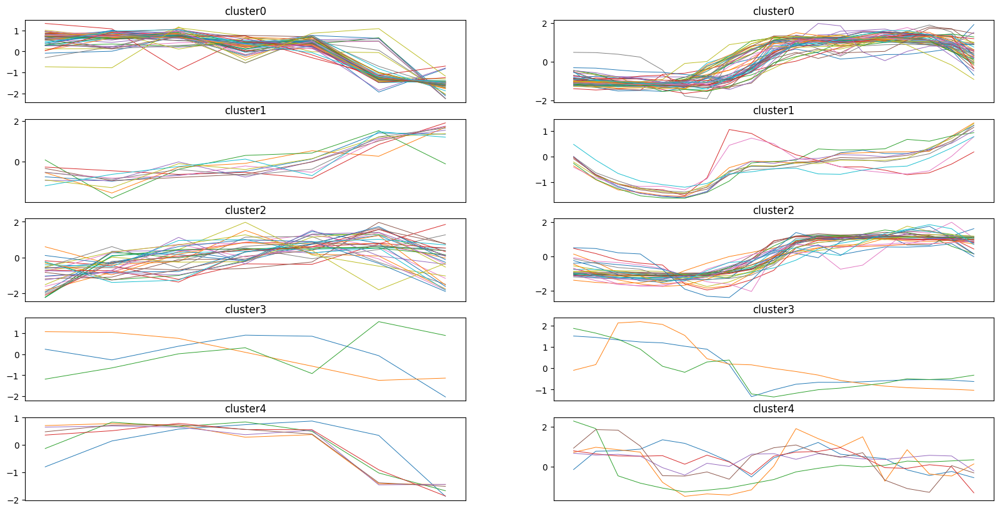

In [101]:
kmeans = KMeans(n_clusters=5, random_state = 2025)
km_cluster = kmeans.fit_predict(df.iloc[:,1:])
df_clust = df.copy()
df_clust['km_cluster'] = km_cluster

# visualizing result of kmeans clustering
n_c = len(np.unique(df_clust.km_cluster))

fig = plt.figure(figsize = (20,10))
for c in range(n_c):
    temp = df_clust[df_clust.km_cluster == c]
    plt.subplot(n_c,2,2*c+1)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,1:8], linewidth=0.7, )
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])
    plt.subplot(n_c,2,2*c+2)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,8:-6], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])

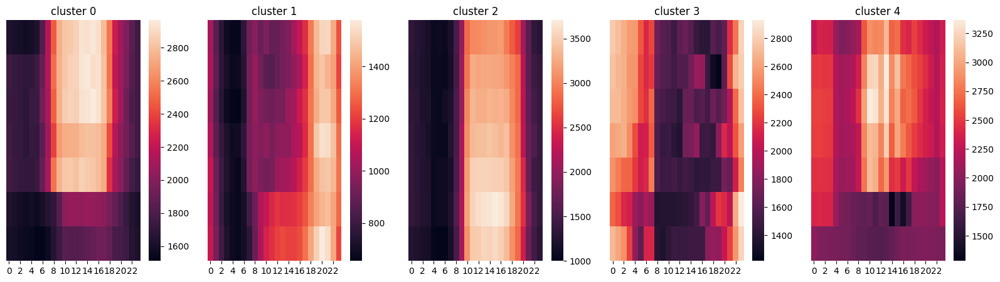

In [102]:
eda_df = train_df.merge(df_clust[['b_num','km_cluster']], on = 'b_num', how = 'left')
fig = plt.figure(figsize = (20, 5))
for c in range(5):
    temp = eda_df[eda_df.km_cluster == c]
    temp = temp.groupby(['dayofweek', 'hour'])['power_consumption'].median().reset_index().pivot_table(index='dayofweek', columns='hour', values='power_consumption')
    plt.subplot(1, 5, c+1)
    sns.heatmap(temp)
    plt.title(f'cluster {c}')
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks([])

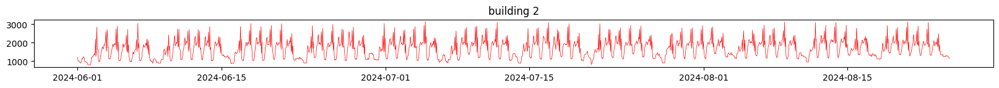

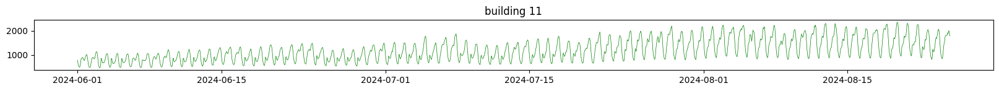

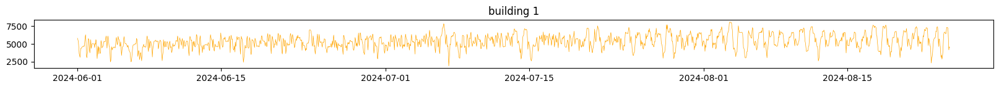

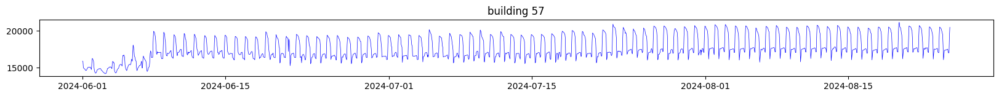

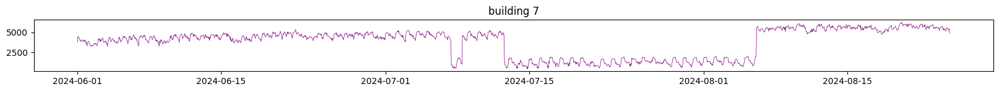

In [103]:
# dictionary mapping cluster and building
match = df_clust[['b_num','km_cluster']]
clust_to_num = {0:[],1:[],2:[],3:[], 4:[]}
for i in range(100):
    c = match.iloc[i,1]
    clust_to_num[c].append(i+1)

# linplot
for c, col in enumerate(['red','green','orange','blue','purple']):
    temp_1 = eda_df[eda_df.km_cluster == c]
    nums = np.unique(temp_1.b_num)
    n_nums = len(nums)
    fig = plt.figure(figsize = (20, 2*n_nums))
    for i, num in enumerate(nums):
        temp_2 = temp_1[temp_1.b_num == num]
        plt.subplot(n_nums,1, i+1)
        sns.lineplot(data = temp_2, x= 'date', y = 'power_consumption', linewidth = 0.5, color = col)
        plt.title(f'building {num}')
        plt.subplots_adjust(hspace = 1)
        plt.ylabel('')
        plt.xlabel('')

        if i == 0:  # DACON upload를 위해 제한
            break

## K=6인 경우에 대해서도 분석을 진행했습니다.

- cluster (day of week / hour)
- energy
- line

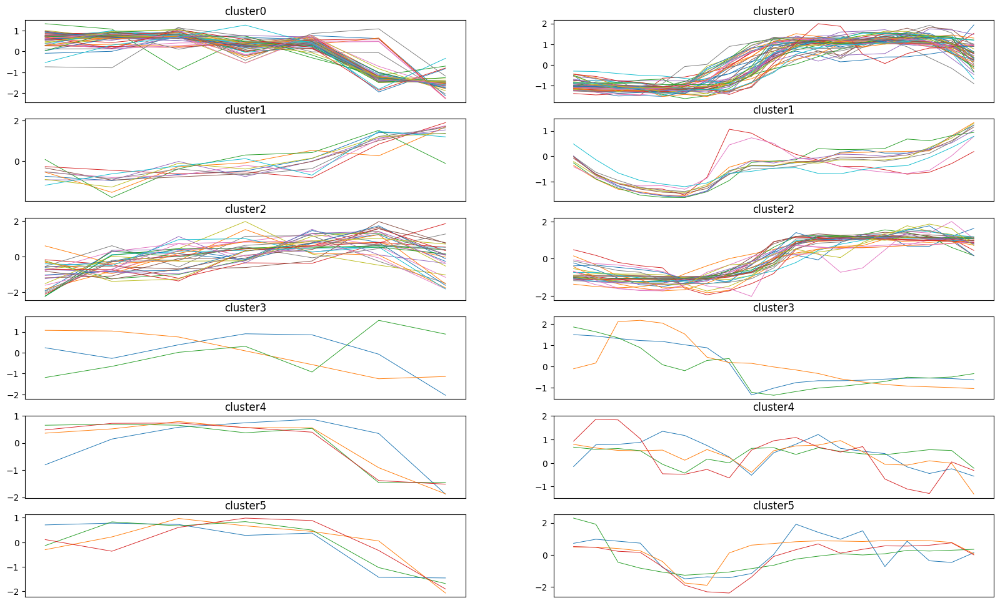

In [104]:
kmeans = KMeans(n_clusters=6, random_state = 2025)
km_cluster = kmeans.fit_predict(df.iloc[:,1:])
df_clust = df.copy()
df_clust['km_cluster'] = km_cluster

# visualizing result of kmeans clustering
n_c = len(np.unique(df_clust.km_cluster))

fig = plt.figure(figsize = (20,12))
for c in range(n_c):
    temp = df_clust[df_clust.km_cluster == c]
    plt.subplot(n_c,2,2*c+1)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,1:8], linewidth=0.7, )
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])
    plt.subplot(n_c,2,2*c+2)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,8:-6], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])

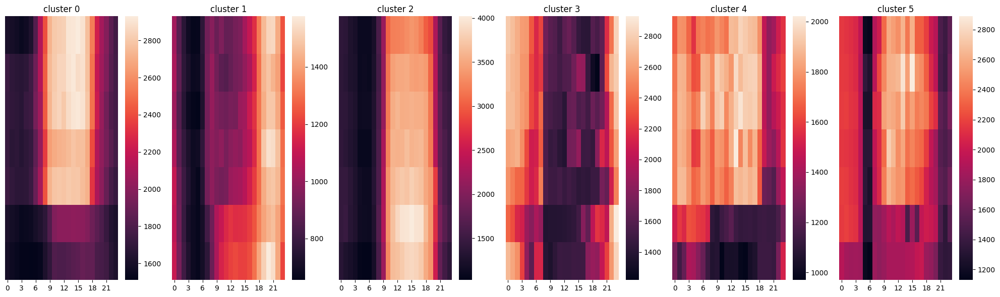

In [105]:
eda_df = train_df.merge(df_clust[['b_num','km_cluster']], on = 'b_num', how = 'left')
fig = plt.figure(figsize = (20, 6))
for c in range(6):
    temp = eda_df[eda_df.km_cluster == c].copy()
    if not temp.empty:
        temp = temp.groupby(['dayofweek', 'hour'])['power_consumption'].median().reset_index().pivot_table(index='dayofweek', columns='hour', values='power_consumption')
        if not temp.empty: # check pivot table is empty
            plt.subplot(1, 6, c+1)
            sns.heatmap(temp)
            plt.title(f'cluster {c}')
            plt.xlabel('')
            plt.ylabel('')
            plt.yticks([])
        else:
            print(f"Cluster {c} has no data for heatmap visualization after grouping.") # Modified
    else:
        print(f"Cluster {c} is empty.")

plt.tight_layout()
plt.show()

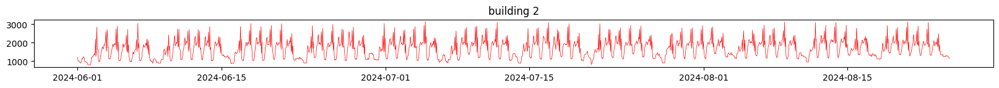

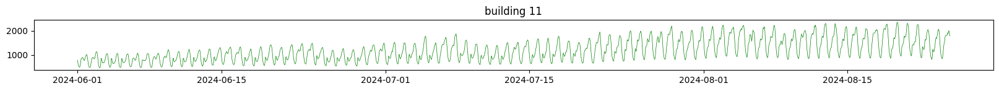

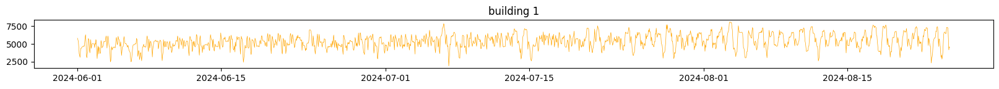

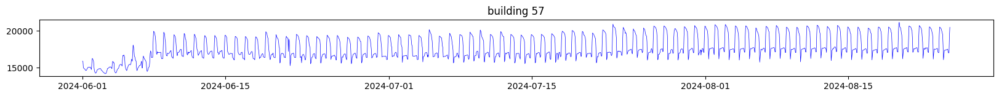

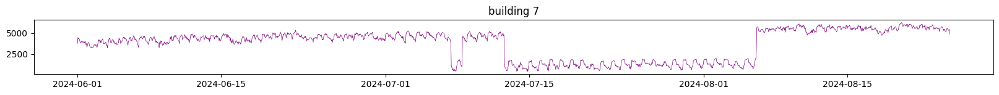

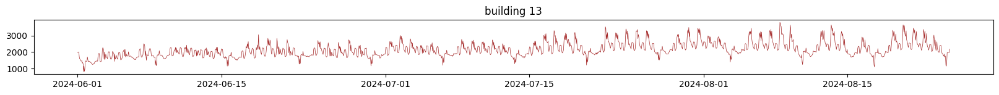

In [106]:
# dictionary mapping cluster and building
match = df_clust[['b_num','km_cluster']]
clust_to_num = {0:[],1:[],2:[],3:[], 4:[], 5:[]}
for i in range(100):
    c = match.iloc[i,1]
    clust_to_num[c].append(i+1)

# linplot(energy usage of each building ~ cluster, datetime)
for c, col in enumerate(['red','green','orange','blue','purple','brown']):
    temp_1 = eda_df[eda_df.km_cluster == c]
    nums = np.unique(temp_1.b_num)
    n_nums = len(nums)
    fig = plt.figure(figsize = (20, 2*n_nums))
    for i, num in enumerate(nums):
        temp_2 = temp_1[temp_1.b_num == num]
        plt.subplot(n_nums,1, i+1)
        sns.lineplot(data = temp_2, x= 'date', y = 'power_consumption', linewidth = 0.5, color = col)
        plt.title(f'building {num}')
        plt.subplots_adjust(hspace = 1)
        plt.ylabel('')
        plt.xlabel('')

        if i == 0:  # DACON upload를 위해 제한
            break

## 해석

- K=4, 5에서 모델이 이해하기 유의미한 클러스터링 결과가 나왔다고 판단했습니다.
- 이전 대회 참가자들이 그랬듯, 군집을 나누면 낮/밤 시간대의 활동량에 따른 분류가 가능합니다.
- 특정 건물유형은 일관된 패턴이 부족하다고 생각되는데, 추후 ensemble 등에 활용하려고 합니다.   

In [108]:
train_df['b_type'].unique()

array(['호텔', '상용', '병원', '학교', '건물기타', '아파트', '연구소', '백화점', 'IDC(전화국)',
       '공공'], dtype=object)

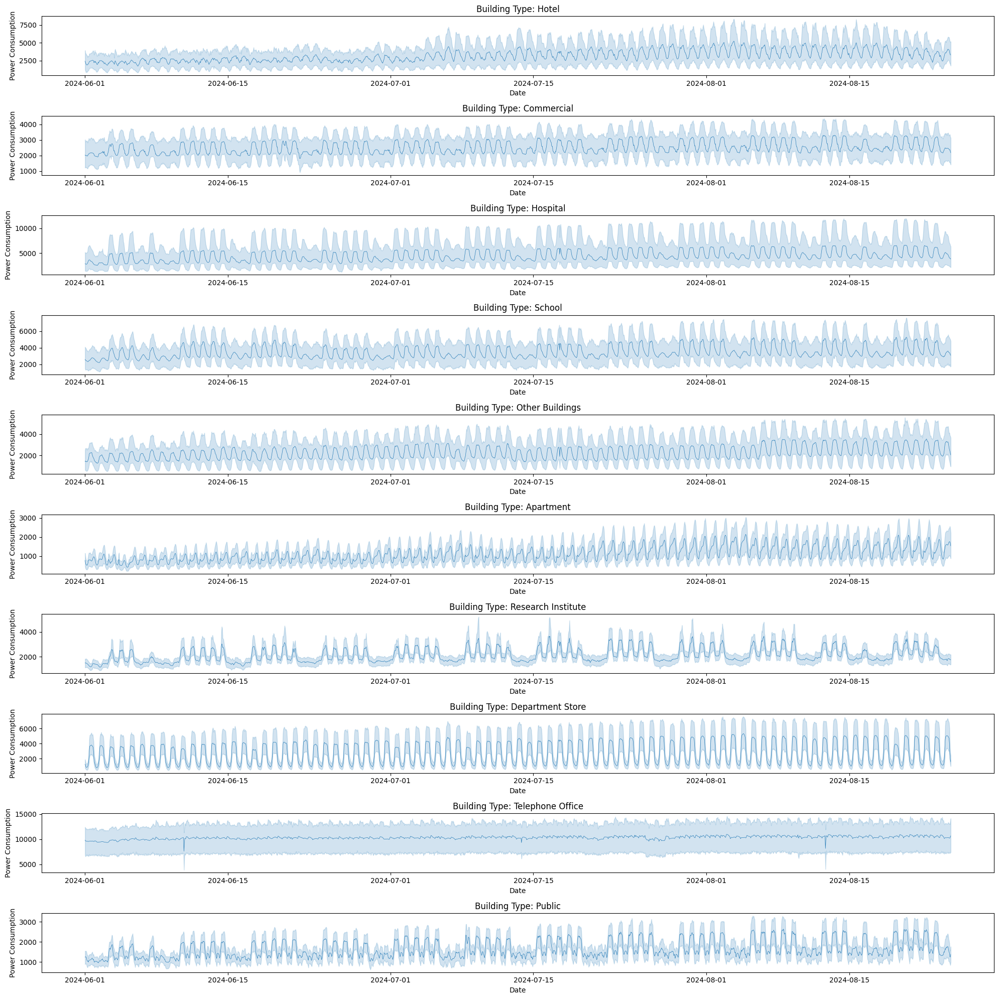

In [109]:
# Q. 특정 건물유형의 패턴이 부족한 경우가 있나요?
# A. sns을 이용해서 line plot을 그려보면 대략적으로 확인이 가능합니다.

translation_dict = {
    '건물기타': 'Other Buildings',
    '학교': 'School',
    'IDC(전화국)': 'Telephone Office',
    '공공': 'Public',
    '백화점': 'Department Store',
    '병원': 'Hospital',
    '상용': 'Commercial',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '호텔': 'Hotel'
}

train_df['b_type'] = train_df['b_type'].map(translation_dict)

unique_b_types = train_df['b_type'].unique()
n_b_types = len(unique_b_types)

fig = plt.figure(figsize=(20, 2 * n_b_types))

for i, b_type in enumerate(unique_b_types):
    temp_df = train_df[train_df['b_type'] == b_type].copy()
    plt.subplot(n_b_types, 1, i + 1)
    sns.lineplot(data=temp_df, x='date', y='power_consumption', linewidth=0.5)
    plt.title(f'Building Type: {b_type}')
    plt.subplots_adjust(hspace=1)
    plt.ylabel('Power Consumption')
    plt.xlabel('Date')

plt.tight_layout()
plt.show()

- 아파트, 공공, 연구소, 그리고 백화점은 패턴이 뚜렷하고, variance가 작습니다.
- 호텔, 상용, 학교, 그리고 병원은 패턴이 뚜렷하지만, variance가 큽니다.
- 건물기타과 전화국은 패턴이 명확하지 않고, variance가 큽니다.  

전력사용량에 대한 개별 plot을 그리면 variance가 큰 건물 유형의 경우, 해당 데이터셋과 다른 유형의 패턴을 보이는 경우가 있었습니다.
해당 패턴이 다른 건물 유형에서도 보이는 경우를 몇 개 확인했고 추후 클러스터링을 통해 보완이 가능하자 않을까 생각하고 있습니다.

In [ ]:
# 빌딩 유형별 자세한 확인이 필요한 경우는 아래 코드에 남겨두겠습니다.
unique_b_types = train_df['b_type'].unique()

for building_type in unique_b_types:
    b_nums_in_type = train_df[train_df['b_type'] == building_type]['b_num'].unique().tolist()
    print(f"power consumption for building type: {building_type}")
    plot_batch_of_buildings_with_week(train_df[train_df['b_type'] == building_type].copy(), 'power_consumption', b_nums_in_type)

- 그래프 및 클러스터링 결과 해석에 대해서는 자유롭게 아이디어 공유 부탁드립니다.
- 작성한 시각화 함수 소개 및 이전 참가자분들의 코드를 최신화에 목적을 두고 작성했습니다.
- DACON 대회 시작하면 감을 잘 못잡았는데, 제 글이 초기 대회 진입하시는 데에 도움이 되었으면 좋겠습니다.

# 참고
- 2021
  - j_sean팀 | Private 1위(5.0293) | XGBoost 단일 모형(https://dacon.io/competitions/official/235736/codeshare/2877?page=1&dtype=recent)
  - [Analytics]동준이, 전력사용 요인 분석 및 모델링(https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent)
  - [Analytics] 하르딘, 제공데이터 최대한 활용하기(https://dacon.io/competitions/official/235736/codeshare/2840?page=1&dtype=recent)
  - [Analytics] 끙정, 이 건물들은 언제, 왜 전기를 쓰는 걸까?(https://dacon.io/competitions/official/235736/codeshare/2835?page=1&dtype=recent)

- 2023
  - [Private 8th] 건물별 XGBoost 단일모델(https://dacon.io/competitions/official/236125/codeshare/8785?page=1&dtype=recent)
  - [Private 3rd] 건물 Type별 XGBoost 단일 모델(https://dacon.io/competitions/official/236125/codeshare/8782?page=1&dtype=recent)
